## Contour Exercise 

In [1]:
import os
from random import choice
import cv2
from IPython.display import Image
from IPython.core.display import HTML
import numpy
import matplotlib.pyplot as plt

In [2]:
def display_image_jupyter(image_path):
    return Image(filename = image_path, 
          width = 1920, 
          height = 939)

In [3]:
def plot_image(image):
    plt.figure(figsize = (50, 15))
    plt.imshow(image)
    plt.show()

In [4]:
test_image_path = './data/20190108_WGS84_S_Mercator_144_98370_-37_90270_144_98628_-37_90171_20.jpg'

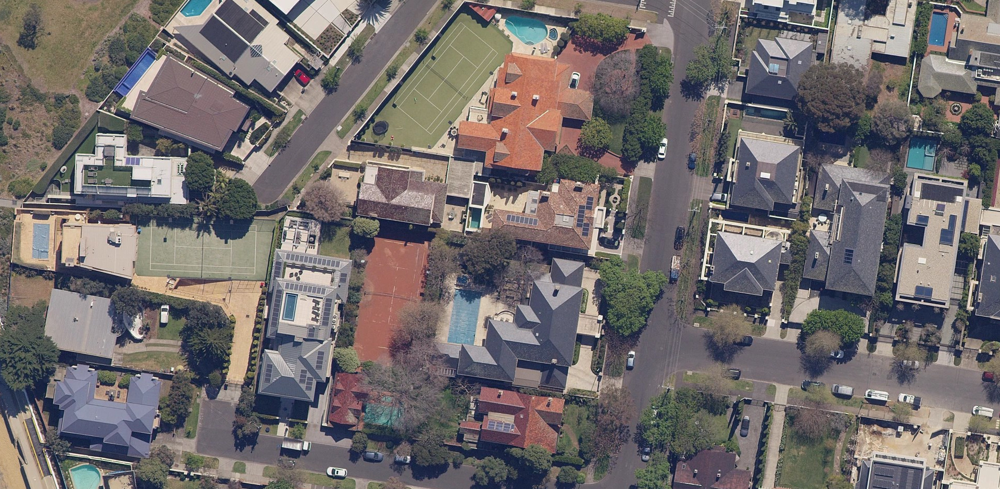

In [5]:
display_image_jupyter(test_image_path)

In [6]:
image = cv2.imread(test_image_path)

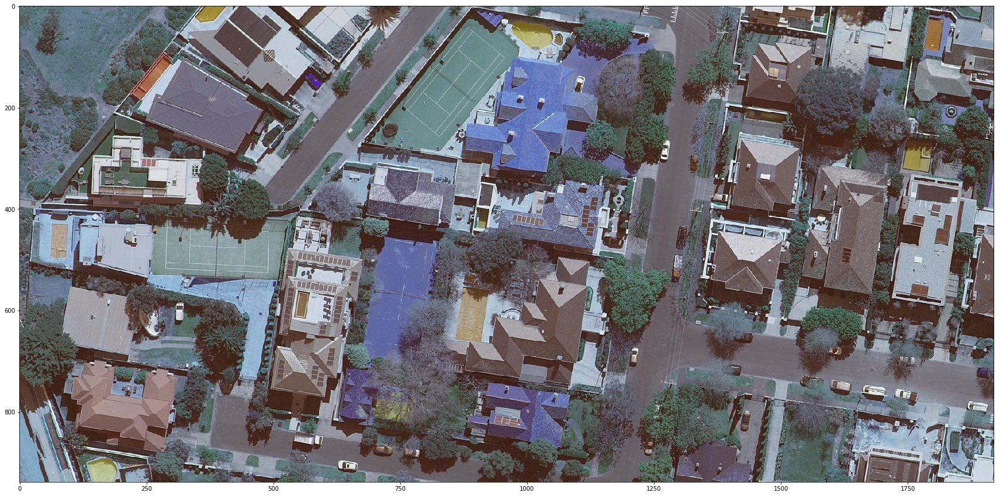

In [7]:
plot_image(image)

## Using HSV space

In [8]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

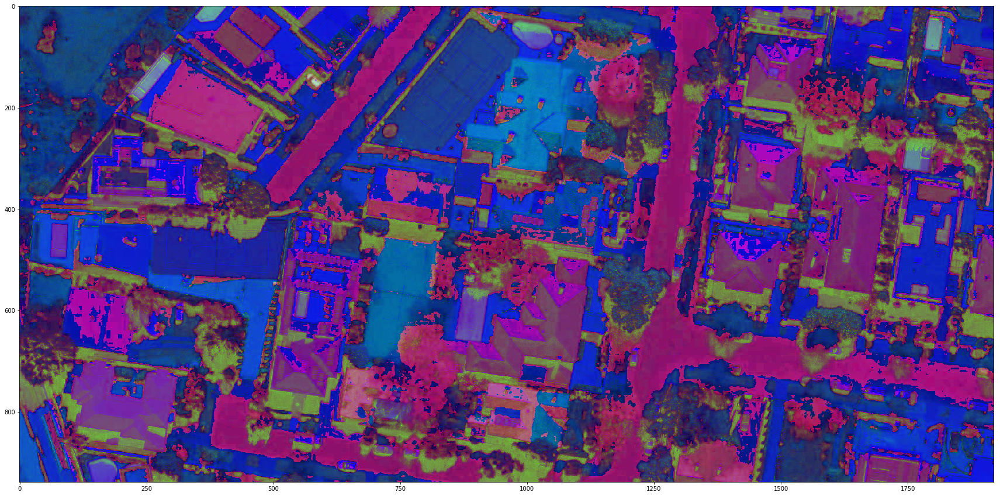

In [9]:
plot_image(hsv_image)

In [10]:
mask = cv2.inRange(hsv_image, 
                   (140, 0, 0), 
                   (160, 255, 255))

imask = mask>0
rooftops = numpy.zeros_like(image, numpy.uint8)
rooftops[imask] = image[imask]

_, contours, _ = cv2.findContours(mask, 
                                  cv2.RETR_TREE, 
                                  cv2.CHAIN_APPROX_SIMPLE)

In [11]:
new_contours = [c for c in contours if 25000 >= cv2.contourArea(c) >= 300]

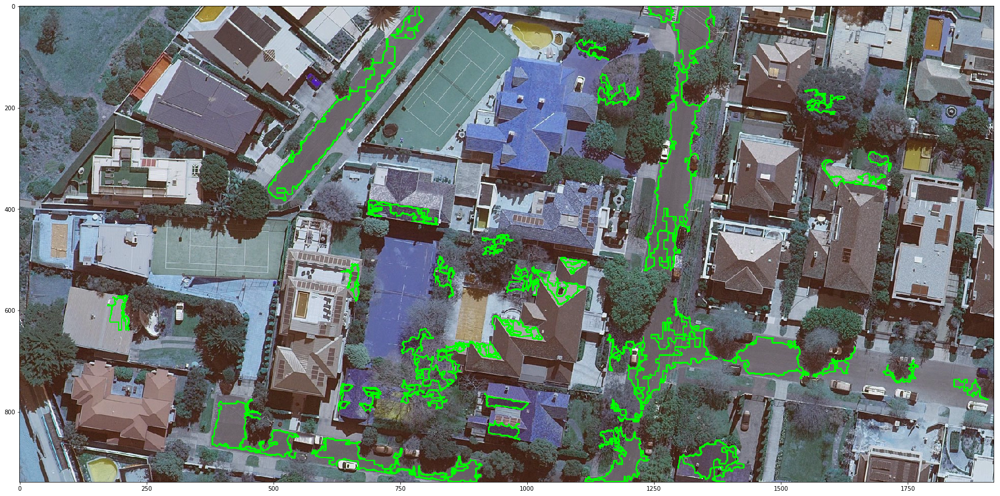

In [12]:
image_copy = image
plot_image(cv2.drawContours(image_copy, new_contours, -1, (0,255,0), 2))

## Using Grey Scale

grey_image = cv2.cvtColor(image ,cv2.COLOR_BGR2GRAY)

plot_image(grey_image)

ret,thresh = cv2.threshold(grey_image, 100,255,0)

im2, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

limits = (1000, 20000)
filtered_contours = [c for c in contours if limits[0] < cv2.contourArea(c) < limits[1]]

print(len(filtered_contours), len(contours))

image_copy = image
plot_image(cv2.drawContours(image_copy, filtered_contours, -1, (0,255,0), 2))